In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
import seaborn as sns
import scipy
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
import warnings as wrn
wrn.filterwarnings('ignore')

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_curve, auc, roc_auc_score, classification_report, confusion_matrix, make_scorer

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

In [53]:
# Línea de código para la carga de datos desde la ubicación original
df = pd.read_excel('/content/drive/MyDrive/Analitica 2/bank_churn.xlsx')
df.head()

,clientnum,attrition_flag,customer_age,gender,dependent_count,education_level,marital_status,income_category,card_category,months_on_book,total_relationship_count,months_inactive_12_mon,contacts_count_12_mon,credit_limit,total_revolving_bal,avg_open_to_buy,total_amt_chng_q4_q1,total_trans_amt,total_trans_ct,total_ct_chng_q4_q1,avg_utilization_ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [54]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   clientnum                 10127 non-null  int64  
 1   attrition_flag            10127 non-null  object 
 2   customer_age              10127 non-null  int64  
 3   gender                    10127 non-null  object 
 4   dependent_count           10127 non-null  int64  
 5   education_level           10127 non-null  object 
 6   marital_status            10127 non-null  object 
 7   income_category           10127 non-null  object 
 8   card_category             10127 non-null  object 
 9   months_on_book            10127 non-null  int64  
 10  total_relationship_count  10127 non-null  int64  
 11  months_inactive_12_mon    10127 non-null  int64  
 12  contacts_count_12_mon     10127 non-null  int64  
 13  credit_limit              10127 non-null  float64
 14  total_

#**EDA**

## Validación valores perdidos

In [55]:
df.isnull().sum()

clientnum                   0
attrition_flag              0
customer_age                0
gender                      0
dependent_count             0
education_level             0
marital_status              0
income_category             0
card_category               0
months_on_book              0
total_relationship_count    0
months_inactive_12_mon      0
contacts_count_12_mon       0
credit_limit                0
total_revolving_bal         0
avg_open_to_buy             0
total_amt_chng_q4_q1        0
total_trans_amt             0
total_trans_ct              0
total_ct_chng_q4_q1         0
avg_utilization_ratio       0
dtype: int64

In [56]:
## Seleccionar dataset con varables numericas

df_numeric = df.loc[:, ['customer_age','dependent_count','total_relationship_count','months_inactive_12_mon','contacts_count_12_mon','credit_limit','total_revolving_bal','avg_open_to_buy',
                        'total_amt_chng_q4_q1', 'total_trans_amt','total_trans_ct','total_ct_chng_q4_q1','avg_utilization_ratio'] ]
df_numeric

,customer_age,dependent_count,total_relationship_count,months_inactive_12_mon,contacts_count_12_mon,credit_limit,total_revolving_bal,avg_open_to_buy,total_amt_chng_q4_q1,total_trans_amt,total_trans_ct,total_ct_chng_q4_q1,avg_utilization_ratio
0,45,3,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,49,5,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,51,3,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,40,4,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,40,3,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,50,2,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,41,2,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,44,1,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,30,2,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


# Detección de valores atipicos

[]

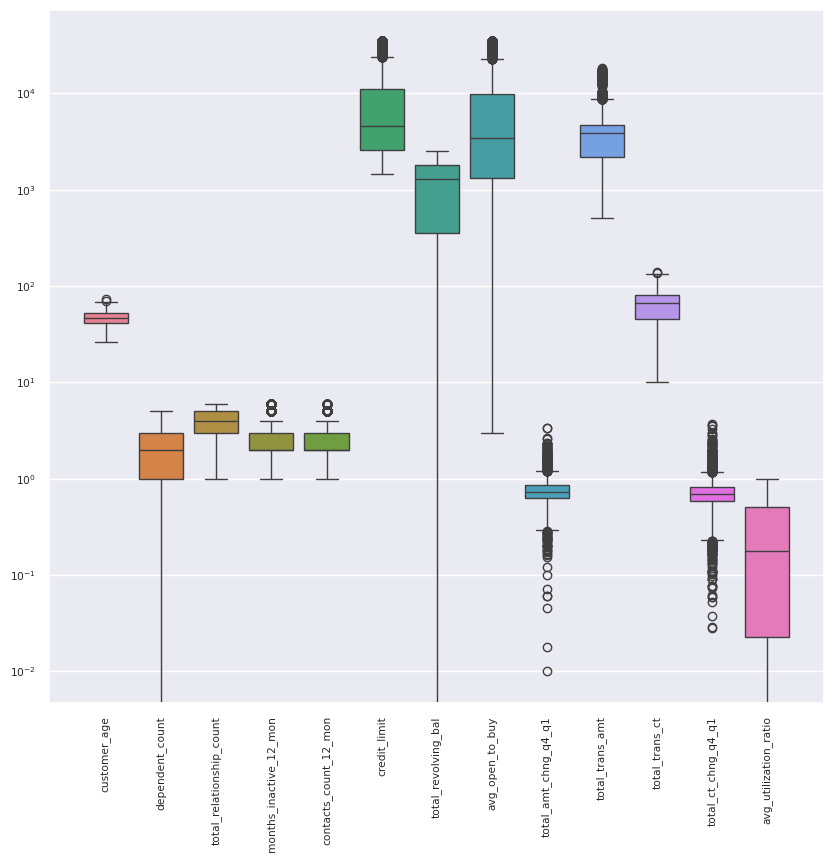

In [41]:
### Boxplot
### se presentan muchos valores atipicos debido a la estructura de negocio
sns.set(rc={'figure.figsize':(10,9)}, font_scale = 0.7)
sns.boxplot(data=df_numeric)
plt.xticks(rotation=90)
plt.semilogy()

# Comportamiento de variables por attrition_flag

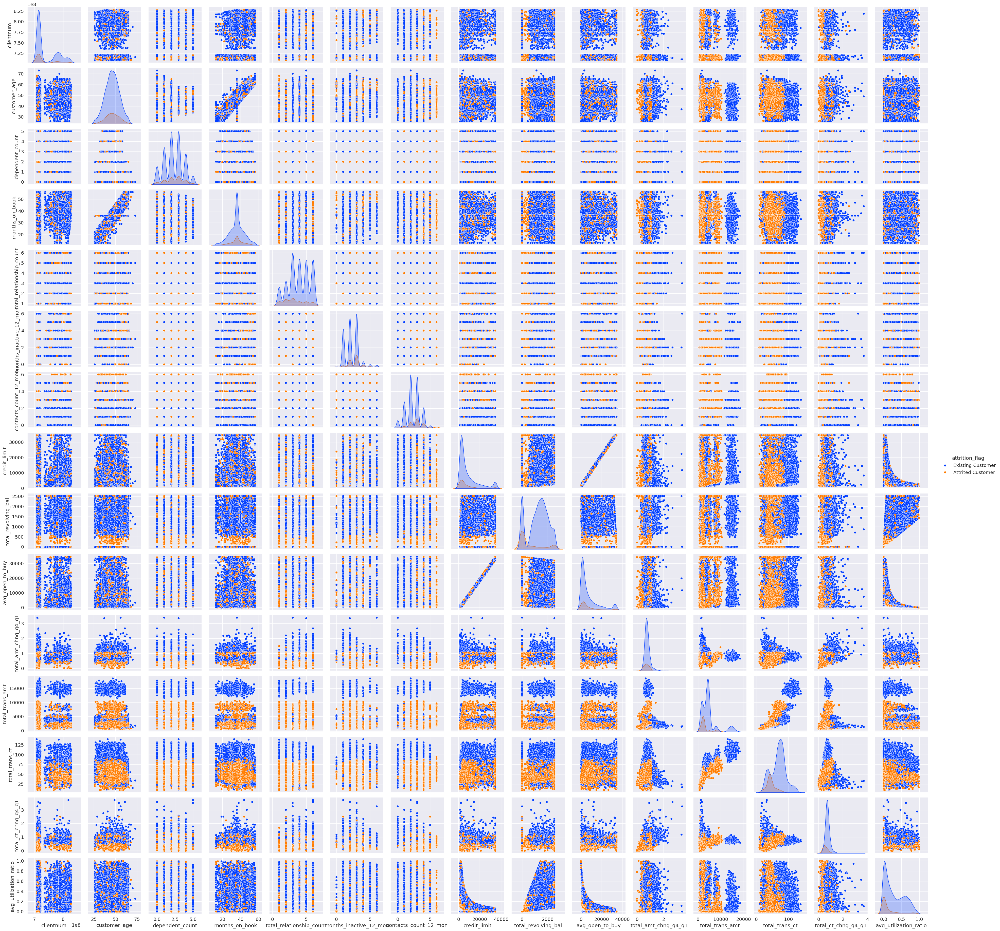

In [15]:
sns.pairplot(df,hue="attrition_flag",palette="bright")

# relaciones entre las variables independientes y la variable objetivo attrition_flag

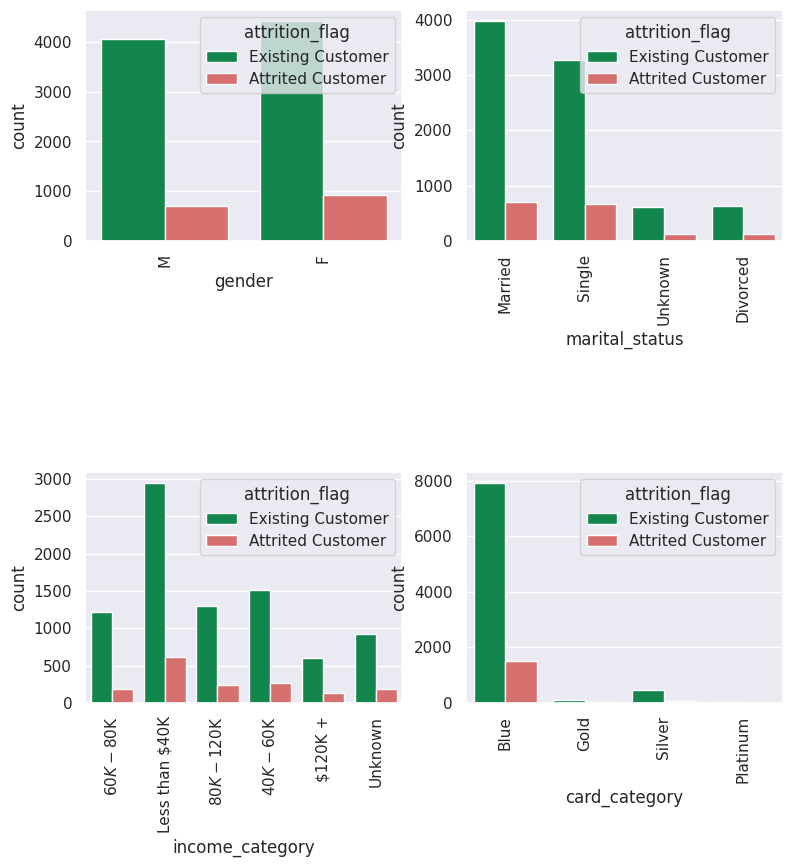

In [37]:
colors = ['#00994D','#E65F5E','#99ff99','#ffcc99']
sns.set(font_scale=1)
plt.figure(figsize=(9,9))
plt.rcParams.update({'font.size': 20})
plt.subplot(221)
sns.countplot(x=df["gender"],hue=df["attrition_flag"], palette=colors)
plt.xticks(rotation=90)

plt.subplot(222)
sns.countplot(x=df["marital_status"],hue=df["attrition_flag"], palette=colors)
plt.xticks(rotation=90)

plt.subplot(223)
sns.countplot(x=df["income_category"],hue=df["attrition_flag"], palette=colors)
plt.xticks(rotation=90)

plt.subplot(224)
sns.countplot(x=df["card_category"],hue=df["attrition_flag"], palette=colors)
plt.xticks(rotation=90)

plt.subplots_adjust(hspace=1)
plt.show()

# Correlación de variables

In [43]:
# Matriz de correlación
# ==============================================================================
corr_matrix = df_numeric.corr(method='pearson')
corr_matrix

,customer_age,dependent_count,total_relationship_count,months_inactive_12_mon,contacts_count_12_mon,credit_limit,total_revolving_bal,avg_open_to_buy,total_amt_chng_q4_q1,total_trans_amt,total_trans_ct,total_ct_chng_q4_q1,avg_utilization_ratio
customer_age,1.000000,-0.122254,-0.010931,0.054361,-0.018452,0.002476,0.014780,0.001151,-0.062042,-0.046446,-0.067097,-0.012143,0.007114
dependent_count,-0.122254,1.000000,-0.039076,-0.010768,-0.040505,0.068065,-0.002688,0.068291,-0.035439,0.025046,0.049912,0.011087,-0.037135
total_relationship_count,-0.010931,-0.039076,1.000000,-0.003675,0.055203,-0.071386,0.013726,-0.072601,0.050119,-0.347229,-0.241891,0.040831,0.067663
months_inactive_12_mon,0.054361,-0.010768,-0.003675,1.000000,0.029493,-0.020394,-0.042210,-0.016605,-0.032247,-0.036982,-0.042787,-0.038989,-0.007503
contacts_count_12_mon,-0.018452,-0.040505,0.055203,0.029493,1.000000,0.020817,-0.053913,0.025646,-0.024445,-0.112774,-0.152213,-0.094997,-0.055471
credit_limit,0.002476,0.068065,-0.071386,-0.020394,0.020817,1.000000,0.042493,0.995981,0.012813,0.171730,0.075927,-0.002020,-0.482965
total_revolving_bal,0.014780,-0.002688,0.013726,-0.042210,-0.053913,0.042493,1.000000,-0.047167,0.058174,0.064370,0.056060,0.089861,0.624022
avg_open_to_buy,0.001151,0.068291,-0.072601,-0.016605,0.025646,0.995981,-0.047167,1.000000,0.007595,0.165923,0.070885,-0.010076,-0.538808
total_amt_chng_q4_q1,-0.062042,-0.035439,0.050119,-0.032247,-0.024445,0.012813,0.058174,0.007595,1.000000,0.039678,0.005469,0.384189,0.035235
total_trans_amt,-0.046446,0.025046,-0.347229,-0.036982,-0.112774,0.171730,0.064370,0.165923,0.039678,1.000000,0.807192,0.085581,-0.083034


In [44]:
def tidy_corr_matrix(corr_mat):
    '''
    Función para convertir una matriz de correlación de pandas en formato tidy.
    '''
    corr_mat = corr_mat.stack().reset_index()
    corr_mat.columns = ['variable_1','variable_2','r']
    corr_mat = corr_mat.loc[corr_mat['variable_1'] != corr_mat['variable_2'], :]
    corr_mat['abs_r'] = np.abs(corr_mat['r'])
    corr_mat = corr_mat.sort_values('abs_r', ascending=False)

    return(corr_mat)

tidy_corr_matrix(corr_matrix).head(10)

,variable_1,variable_2,r,abs_r
72,credit_limit,avg_open_to_buy,0.995981,0.995981
96,avg_open_to_buy,credit_limit,0.995981,0.995981
139,total_trans_ct,total_trans_amt,0.807192,0.807192
127,total_trans_amt,total_trans_ct,0.807192,0.807192
90,total_revolving_bal,avg_utilization_ratio,0.624022,0.624022
162,avg_utilization_ratio,total_revolving_bal,0.624022,0.624022
163,avg_utilization_ratio,avg_open_to_buy,-0.538808,0.538808
103,avg_open_to_buy,avg_utilization_ratio,-0.538808,0.538808
77,credit_limit,avg_utilization_ratio,-0.482965,0.482965
161,avg_utilization_ratio,credit_limit,-0.482965,0.482965


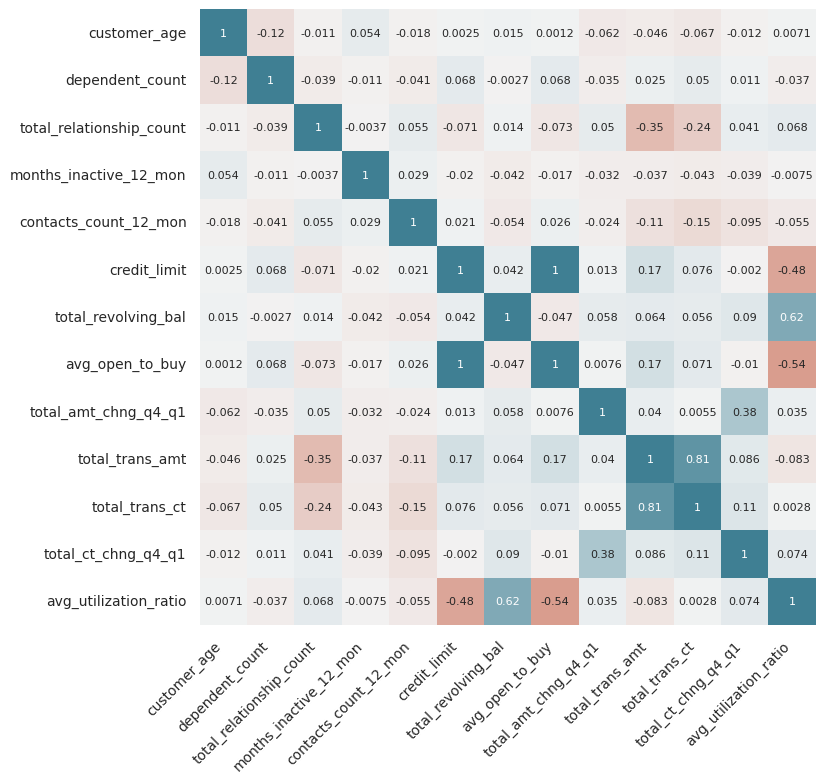

In [47]:
#### Correlograma

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 8))

sns.heatmap(
    corr_matrix,
    annot     = True,
    cbar      = False,
    annot_kws = {"size": 8},
    vmin      = -1,
    vmax      = 1,
    center    = 0,
    cmap      = sns.diverging_palette(20, 220, n=200),
    square    = True,
    ax        = ax
)

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation = 45,
    horizontalalignment = 'right',
)

ax.tick_params(labelsize = 10)

### Participación churn

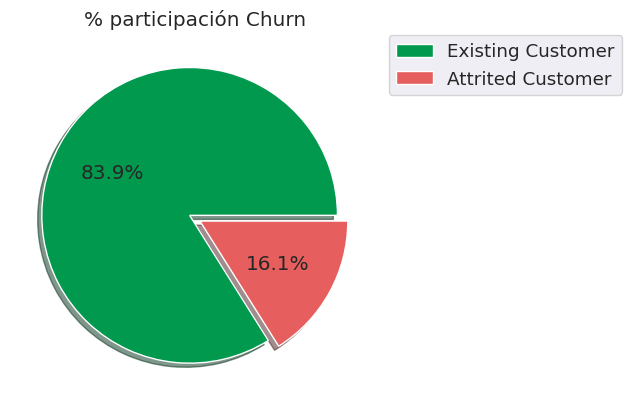

In [13]:
colors = ['#00994D','#E65F5E','#99ff99','#ffcc99']
data = df['attrition_flag'].value_counts()
ax = data.plot(kind="pie", autopct='%1.1f%%', shadow=True, explode=[0.04, 0.04], colors=colors, legend=True, title='% participación Churn', ylabel='', labeldistance=None)
ax.legend(bbox_to_anchor=(1, 1.02), loc='upper left')
plt.show() ##### Podemos observar que la data se encuentra desbaanceada se debe aplicar tecnicas de oversampling o undersampling

# feature engineering

In [57]:
df['Churn'] = df['attrition_flag'].replace(['Existing Customer', 'Attrited Customer'], [0, 1])

# Creación de Variables dummies

In [58]:
df = pd.get_dummies(df, columns = df.select_dtypes(exclude=['int64','float64']).columns, drop_first = True)

pd.options.display.max_columns = None # remove the limit on the number of columns by default only 20 are shows

df.head() ## tenenemos 34 variables

,clientnum,customer_age,dependent_count,months_on_book,total_relationship_count,months_inactive_12_mon,contacts_count_12_mon,credit_limit,total_revolving_bal,avg_open_to_buy,total_amt_chng_q4_q1,total_trans_amt,total_trans_ct,total_ct_chng_q4_q1,avg_utilization_ratio,Churn,attrition_flag_Existing Customer,gender_M,education_level_Doctorate,education_level_Graduate,education_level_High School,education_level_Post-Graduate,education_level_Uneducated,education_level_Unknown,marital_status_Married,marital_status_Single,marital_status_Unknown,income_category_$40K - $60K,income_category_$60K - $80K,income_category_$80K - $120K,income_category_Less than $40K,income_category_Unknown,card_category_Gold,card_category_Platinum,card_category_Silver
0,768805383,45,3,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0,True,True,False,False,True,False,False,False,True,False,False,False,True,False,False,False,False,False,False
1,818770008,49,5,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0,True,False,False,True,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False
2,713982108,51,3,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0,True,True,False,True,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False
3,769911858,40,4,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0,True,False,False,False,True,False,False,False,False,False,True,False,False,False,True,False,False,False,False
4,709106358,40,3,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0,True,True,False,False,False,False,True,False,True,False,False,False,True,False,False,False,False,False,False


In [59]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 35 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   clientnum                         10127 non-null  int64  
 1   customer_age                      10127 non-null  int64  
 2   dependent_count                   10127 non-null  int64  
 3   months_on_book                    10127 non-null  int64  
 4   total_relationship_count          10127 non-null  int64  
 5   months_inactive_12_mon            10127 non-null  int64  
 6   contacts_count_12_mon             10127 non-null  int64  
 7   credit_limit                      10127 non-null  float64
 8   total_revolving_bal               10127 non-null  int64  
 9   avg_open_to_buy                   10127 non-null  float64
 10  total_amt_chng_q4_q1              10127 non-null  float64
 11  total_trans_amt                   10127 non-null  int64  
 12  tota

# Selección df_final

In [60]:
## selección de variables

df_final = df.drop(['clientnum','avg_open_to_buy','attrition_flag_Existing Customer','credit_limit'], axis=1)

# **Train test**

In [61]:
y = df_final['Churn']
X = df_final.drop(columns = 'Churn')

In [62]:
print(y.shape)
print(X.shape)

(10127,)
(10127, 30)


In [63]:
# Para futuras comparaciones establecemos una semilla para generar numeros alea
np.random.seed(4406)

# Dividimos aleatoriamente los datos en 70% train y 30% test
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.30, random_state = 4406)

In [64]:
print(y_train.shape)
print(y_test.shape)

(7088,)
(3039,)


# Modelos

metricas

In [65]:
# se definen las metricas del modelo

# ROC curve
def plot_roc(y_test, y_pred):
    fpr, tpr, thresholds = roc_curve(y_test, y_pred, pos_label=1, drop_intermediate = False)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    lw = 2
    plt.plot(fpr, tpr, color='darkorange',
             lw=lw, label='ROC curve (AUC = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([-0.001, 1.001])
    plt.ylim([-0.001, 1.001])
    plt.xlabel('1-Specificity (False Negative Rate)')
    plt.ylabel('Sensitivity (True Positive Rate)')
    plt.title('ROC curve')
    plt.legend(loc="lower right")
    plt.show()

# Confusion Matrix returns in the format: cm[0,0], cm[0,1], cm[1,0], cm[1,1]: tn, fp, fn, tp

# Sensitivity
def custom_sensitivity_score(y_test, y_pred):
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm[0][0], cm[0][1], cm[1][0], cm[1][1]
    return (tp/(tp+fn))

# Specificity
def custom_specificity_score(y_test, y_pred):
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm[0][0], cm[0][1], cm[1][0], cm[1][1]
    return (tn/(tn+fp))

# Positive Predictive Value
def custom_ppv_score(y_test, y_pred):
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm[0][0], cm[0][1], cm[1][0], cm[1][1]
    return (tp/(tp+fp))

# Negative Predictive Value
def custom_npv_score(y_test, y_pred):
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm[0][0], cm[0][1], cm[1][0], cm[1][1]
    return (tn/(tn+fn))

# Accuracy
def custom_accuracy_score(y_test, y_pred):
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm[0][0], cm[0][1], cm[1][0], cm[1][1]
    return ((tn+tp)/(tn+tp+fn+fp))

# SVM

In [66]:
from sklearn import svm
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

svm_estimators = []
svm_estimators.append(('standardize', StandardScaler())) # scale the data
svm_estimators.append(('SVM', svm.SVC(probability=True))) # define SVM with probabilities (recall, SVM be default does not predict probabilities)

# Define the support vectors machine model and call it classifier_SVM
Classifier_SVM = Pipeline(svm_estimators, verbose=False)

# Train the model classifier_SVM on the training data
Classifier_SVM.fit(X_train, y_train)

Pipeline(steps=[('standardize', StandardScaler()),
                ('SVM', SVC(probability=True))])

Metrics of the Support Vector Machines model: 

Confusion matrix: 
[[2479  245]
 [  40  275]]
                                   Accuracy: 0.9062191510365252
                   SENSITIVITY (aka RECALL): 0.5288461538461539
                 SPECIFICITY (aka FALL-OUT): 0.9841206828106391
 POSITIVE PREDICTIVE VALUE, (aka PRECISION): 0.873015873015873
                 NEGATIVE PREDICTIVE VALUE): 0.9100587371512482


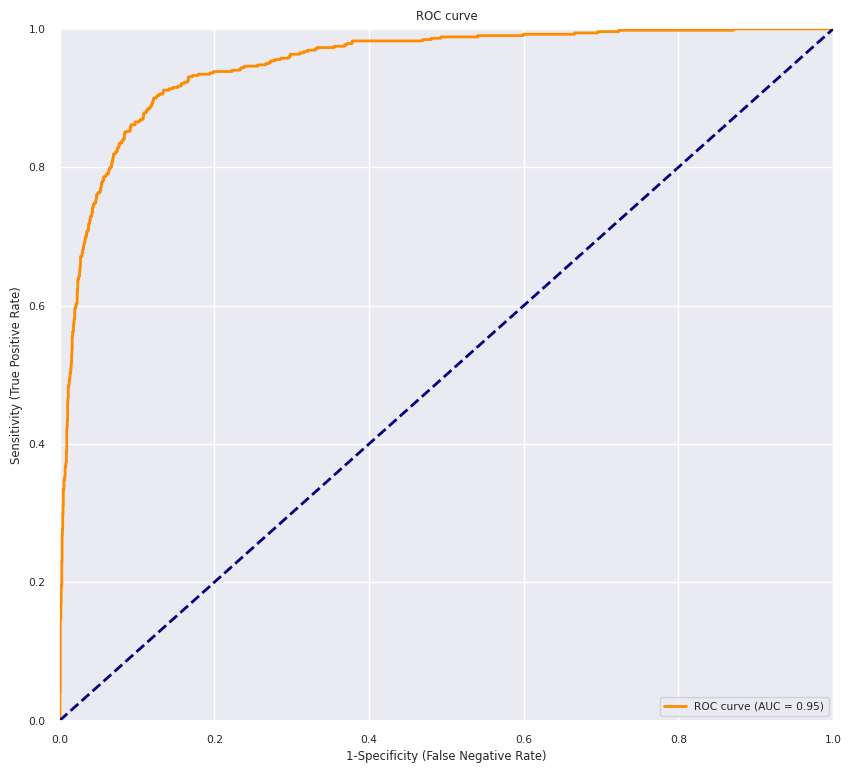

 AUC: 0.9496976822304335


In [67]:
# Select the threshold value -- we will use Т=0.6073. Why? Why not 50%? Because 60.73% -- is the average probability of retention in our data (1451 "1"s out of 2389 datapoints)
class_threshold = 0.712 ### debe ser más riguroso es la media de los y

# use the fitted model to predict the testing data
y_pred_prob = Classifier_SVM.predict_proba(X_test)[:,1] # probabilities
y_pred = np.where(y_pred_prob > class_threshold, 1, 0) # classification

# Lets look at the model metrics

print('Metrics of the Support Vector Machines model: \n')

cm = np.transpose(confusion_matrix(y_test, y_pred))
print("Confusion matrix: \n" + str(cm))

print("                                   Accuracy: " + str(custom_accuracy_score(y_test, y_pred)))
print("                   SENSITIVITY (aka RECALL): " + str(custom_sensitivity_score(y_test, y_pred)))
print("                 SPECIFICITY (aka FALL-OUT): " + str(custom_specificity_score(y_test, y_pred)))
print(" POSITIVE PREDICTIVE VALUE, (aka PRECISION): " + str(custom_ppv_score(y_test, y_pred)))
print("                 NEGATIVE PREDICTIVE VALUE): " + str(custom_npv_score(y_test, y_pred)))

plot_roc(y_test, y_pred_prob)
print(" AUC: " + str(roc_auc_score(y_test, y_pred_prob)))

#ADDA BOOST

In [68]:
# Import the AdaBoost classifier
from sklearn.ensemble import AdaBoostClassifier

abc = []
abc.append(('standardize', StandardScaler())) # scale the data
abc.append(('ABC', AdaBoostClassifier(n_estimators=150, learning_rate=1, random_state=0)))

# Define the support vectors machine model and call it classifier_SVM
Classifier_abc = Pipeline(abc, verbose=False)

# Train the model classifier_SVM on the training data
Classifier_abc.fit(X_train, y_train)

Pipeline(steps=[('standardize', StandardScaler()),
                ('ABC',
                 AdaBoostClassifier(learning_rate=1, n_estimators=150,
                                    random_state=0))])

Metrics of the adabbost : 

Confusion matrix: 
[[2460   79]
 [  59  441]]
                                   Accuracy: 0.9545903257650543
                   SENSITIVITY (aka RECALL): 0.8480769230769231
                 SPECIFICITY (aka FALL-OUT): 0.9765780071456928
 POSITIVE PREDICTIVE VALUE, (aka PRECISION): 0.882
                 NEGATIVE PREDICTIVE VALUE): 0.968885387948011


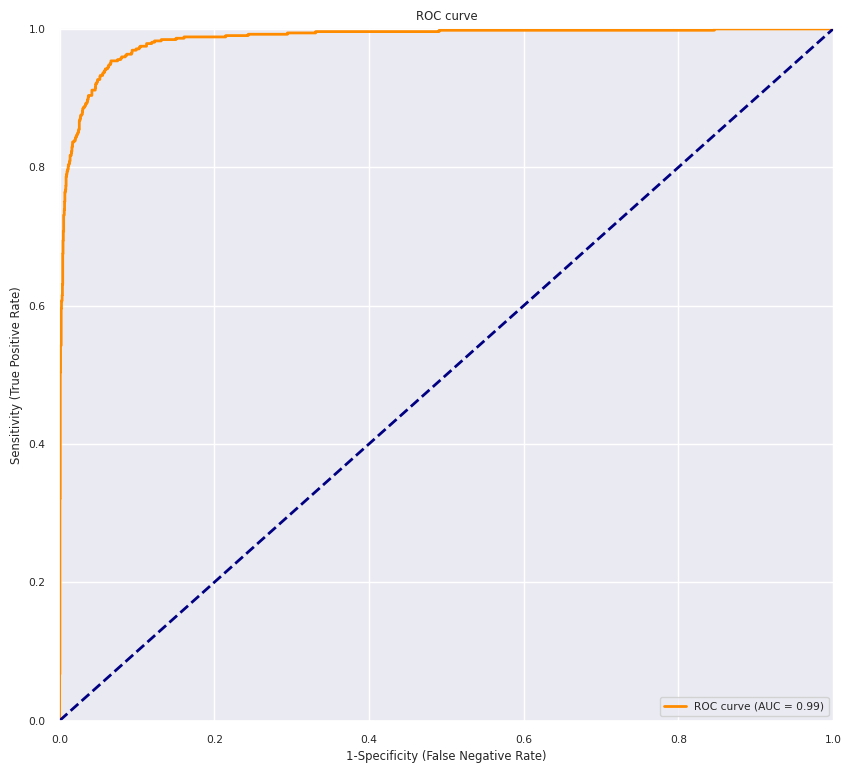

 AUC: 0.985162763001191


In [69]:
# Select the threshold value -- we will use Т=0.6073. Why? Why not 50%? Because 60.73% -- is the average probability of retention in our data (1451 "1"s out of 2389 datapoints)
class_threshold = 0.50 ### debe ser más riguroso es la media de los y

# use the fitted model to predict the testing data
y_pred_prob_3 = Classifier_abc.predict_proba(X_test)[:,1] # probabilities
y_pred_3 = np.where(y_pred_prob_3 > class_threshold, 1, 0) # classification

# Lets look at the model metrics

print('Metrics of the adabbost : \n')

cm = np.transpose(confusion_matrix(y_test, y_pred_3))
print("Confusion matrix: \n" + str(cm))

print("                                   Accuracy: " + str(custom_accuracy_score(y_test, y_pred_3)))
print("                   SENSITIVITY (aka RECALL): " + str(custom_sensitivity_score(y_test, y_pred_3)))
print("                 SPECIFICITY (aka FALL-OUT): " + str(custom_specificity_score(y_test, y_pred_3)))
print(" POSITIVE PREDICTIVE VALUE, (aka PRECISION): " + str(custom_ppv_score(y_test, y_pred_3)))
print("                 NEGATIVE PREDICTIVE VALUE): " + str(custom_npv_score(y_test, y_pred_3)))

plot_roc(y_test, y_pred_prob_3)
print(" AUC: " + str(roc_auc_score(y_test, y_pred_prob_3)))

# REG LOGISTICA

In [70]:
lrmodel = []
lrmodel.append(('standardize', StandardScaler())) # scale the data
lrmodel.append(('Reglogic', LogisticRegression())) # define SVM with probabilities (recall, SVM be default does not predict probabilities)

# Define the support vectors machine model and call it classifier_SVM
Classifier_logreg = Pipeline(lrmodel, verbose=False)

# Train the model classifier_SVM on the training data
Classifier_logreg.fit(X_train, y_train)

Pipeline(steps=[('standardize', StandardScaler()),
                ('Reglogic', LogisticRegression())])

Metrics of the logreg model: 

Confusion matrix: 
[[2453  254]
 [  66  266]]
                                   Accuracy: 0.8947022046725897
                   SENSITIVITY (aka RECALL): 0.5115384615384615
                 SPECIFICITY (aka FALL-OUT): 0.9737991266375546
 POSITIVE PREDICTIVE VALUE, (aka PRECISION): 0.8012048192771084
                 NEGATIVE PREDICTIVE VALUE): 0.9061691909863318


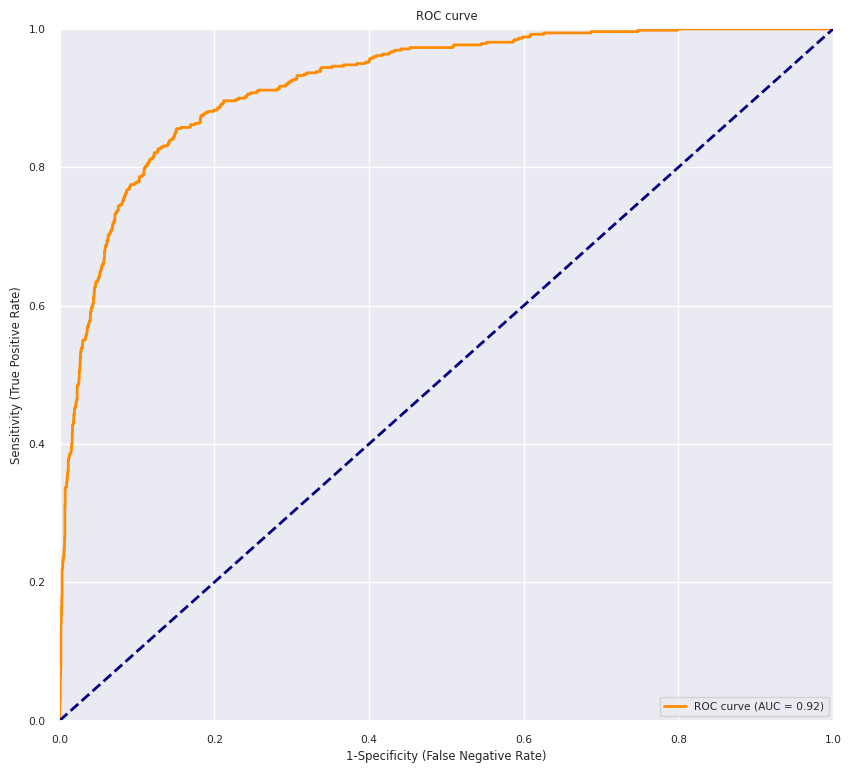

 AUC: 0.9222386783522154


In [71]:
# Select the threshold value -- we will use Т=0.6073. Why? Why not 50%? Because 60.73% -- is the average probability of retention in our data (1451 "1"s out of 2389 datapoints)
class_threshold = 0.60 ### debe ser más riguroso es la media de los y

# use the fitted model to predict the testing data
y_pred_prob_2 = Classifier_logreg.predict_proba(X_test)[:,1] # probabilities
y_pred_2 = np.where(y_pred_prob_2 > class_threshold, 1, 0) # classification

# Lets look at the model metrics

print('Metrics of the logreg model: \n')

cm = np.transpose(confusion_matrix(y_test, y_pred_2))
print("Confusion matrix: \n" + str(cm))

print("                                   Accuracy: " + str(custom_accuracy_score(y_test, y_pred_2)))
print("                   SENSITIVITY (aka RECALL): " + str(custom_sensitivity_score(y_test, y_pred_2)))
print("                 SPECIFICITY (aka FALL-OUT): " + str(custom_specificity_score(y_test, y_pred_2)))
print(" POSITIVE PREDICTIVE VALUE, (aka PRECISION): " + str(custom_ppv_score(y_test, y_pred_2)))
print("                 NEGATIVE PREDICTIVE VALUE): " + str(custom_npv_score(y_test, y_pred_2)))

plot_roc(y_test, y_pred_prob_2)
print(" AUC: " + str(roc_auc_score(y_test, y_pred_prob_2)))